# Setting Up Necessary Things

In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [ ]:
!pip install -Uqq pip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 21.1 MB/s eta 0:00:00


In [ ]:
!pip install -Uqq fastai fastbook nbdev

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.1/66.1 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.7/58.7 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 23.3 MB/s eta 0:00:00


In [ ]:
from fastai import *
from fastbook import *
from fastai.vision.all import *

from fastai.vision.widgets import *

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/Datasets/musical_instrument_recognizer

/content/drive/My Drive/Datasets/musical_instrument_recognizer


# Download Images from Browser

In [ ]:
musical_instruments = [
    'Harmonium',
    'Tabla',
    'Tanpura',
    'Sarod',
    'Santoor',
    'Sitar',
    'Sarangi',
    'Bansuri',
    'Pakhawaz',
    'Shehnai'
]

In [ ]:
images = search_images_ddg(musical_instruments[0])
print(f"No of Images => {len(images)} -- One Image URL => {images[0]}")

In [ ]:
dest = "Harmonium.jpg"
download_url(images[0], dest, show_progress=True)

In [ ]:
image = Image.open(dest)
image.thumbnail((128, 128))

In [ ]:
image

In [ ]:
data_path = "data"
if not os.path.exists(data_path):
  os.mkdir(data_path)

for instrument in musical_instruments:

  dest = f"{data_path}/{instrument}"
  if not os.path.exists(dest):
    os.mkdir(dest)

  try:
    instrument_image_urls = search_images_ddg(instrument)
    download_images(dest, urls = instrument_image_urls)

  except:
    continue

In [ ]:
image_counts = get_image_files(data_path)
len(image_counts)

1455

In [ ]:
failed = verify_images(image_counts)
len(failed)

0

In [ ]:
failed.map(Path.unlink)

In [ ]:
doc(verify_images)

# From Data to Data Loaders

In [ ]:
bs = 32  # batch size
version = 6

In [ ]:
data_path = "data"

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,                        # get_image_files returns a list of all images in that path recursively by default
    splitter=RandomSplitter(valid_pct=0.13, seed=42),  # getting 90-10 train-validation split
    get_y=parent_label,                               # taking the folder name as labels
    item_tfms=Resize(128))                            # resizing to get the image of same shape


dblock = dblock.new(item_tfms=RandomResizedCrop(192, min_scale=0.5), batch_tfms=aug_transforms())
dls = dblock.dataloaders(data_path, bs = bs)
torch.save(dls, f"musical_instrument_dataloader_v{version}.pkl")

In [ ]:
dls = torch.load(f"musical_instrument_dataloader_v{version}.pkl")

In [ ]:
dls.train.vocab

['Bansuri', 'Harmonium', 'Pakhawaz', 'Santoor', 'Sarangi', 'Sarod', 'Shehnai', 'Sitar', 'Tabla', 'Tanpura']

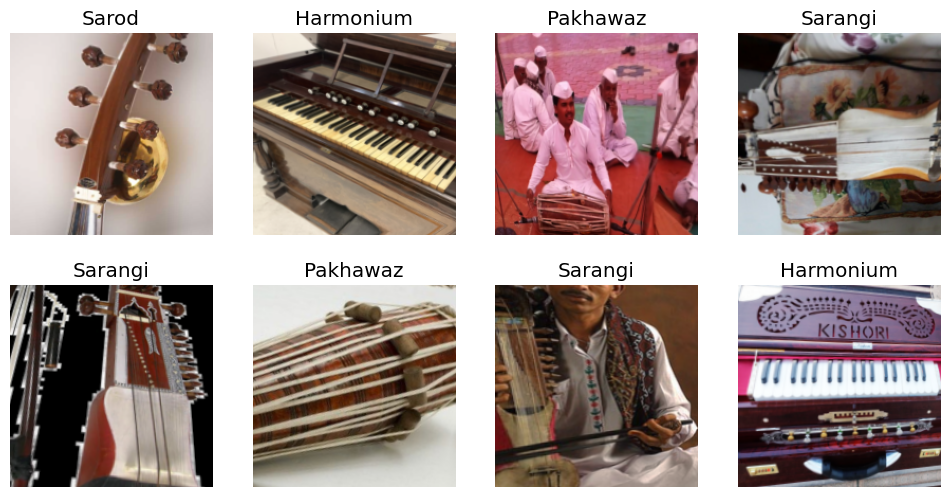

In [ ]:
dls.train.show_batch(max_n=8, nrows=2)

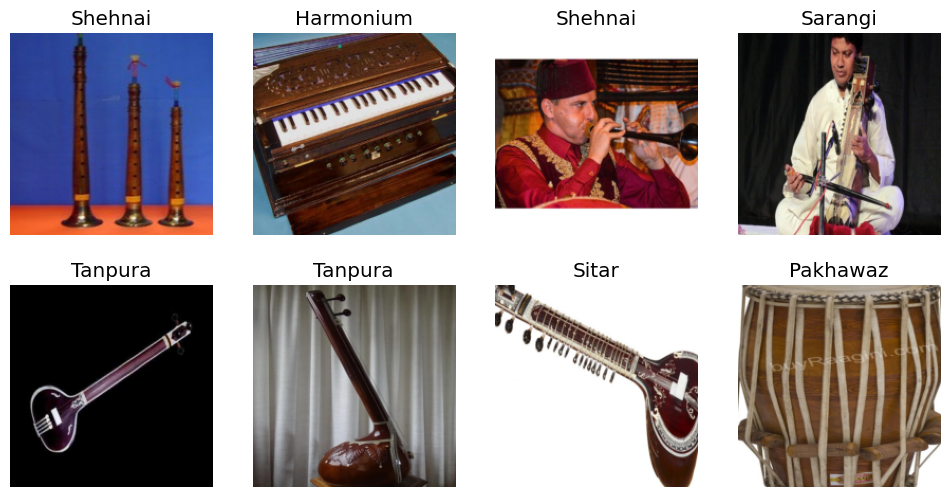

In [ ]:
dls.valid.show_batch(max_n=8, nrows=2)

In [ ]:
train_size = len(dls.train.dataset)
valid_size = len(dls.valid.dataset)

print(f"Training set size: {train_size}")
print(f"Validation set size: {valid_size}")

Training set size: 1265
Validation set size: 189


# Training and Data Cleaning

In [ ]:
model_path = "models"

In [ ]:
model = vision_learner(dls, resnet34, metrics=[error_rate,accuracy])

/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:263: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  return getattr(torch, 'has_mps', False)


In [ ]:
# model.load(f"musical-instrument-recognizer-v{version}")

In [ ]:
model.fine_tune(2)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,2.009352,0.439974,0.121693,0.878307,06:27


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.651132,0.356983,0.079365,0.920635,09:23
1,0.474943,0.270878,0.058201,0.941799,09:27


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
model.save(f"musical-instrument-recognizer-v{version}")

Path('models/musical-instrument-recognizer-v6.pth')

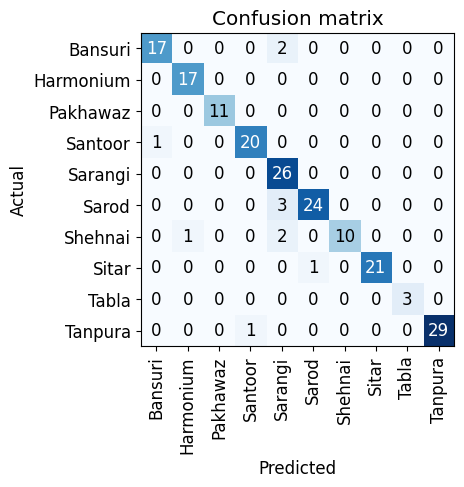

In [ ]:
interp = ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix()

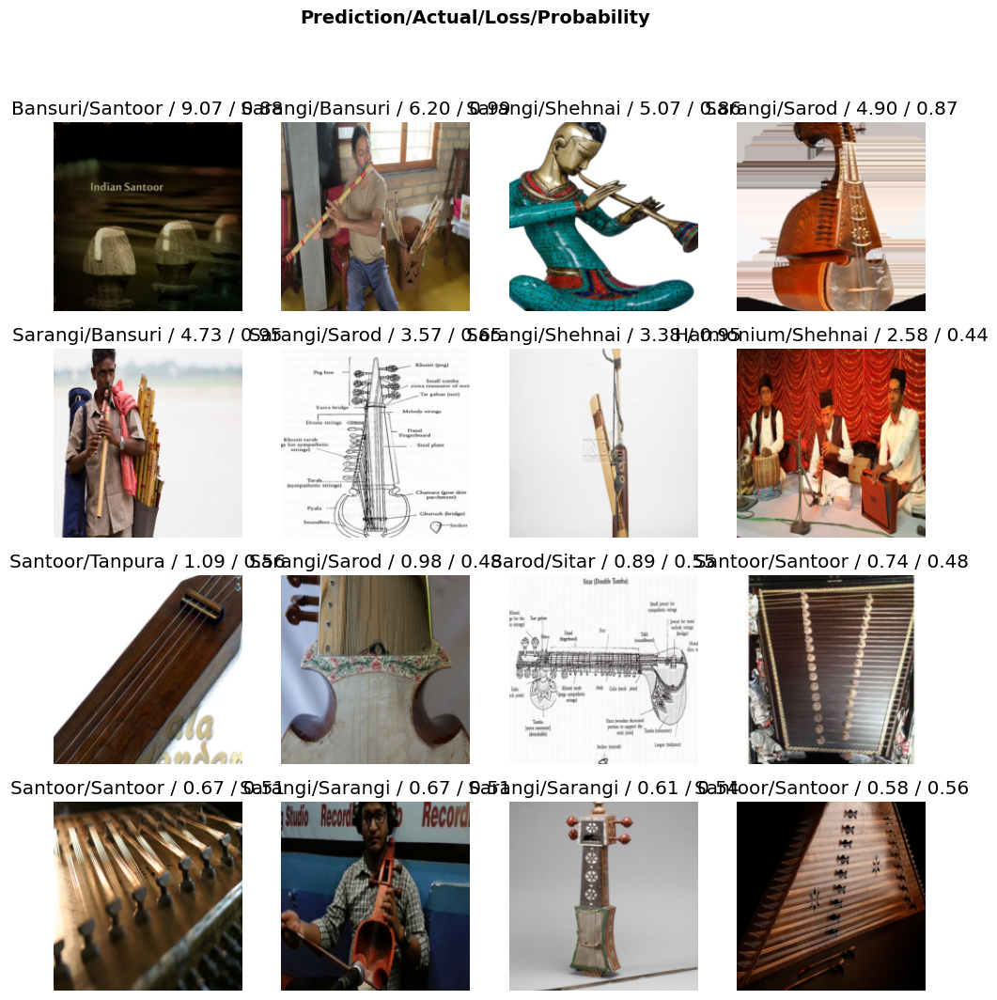

In [ ]:
interp.plot_top_losses(16, nrows=4)

In [ ]:
cleaner = ImageClassifierCleaner(model)
cleaner

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
# Delete irrelevant data
for idx in cleaner.delete():
    cleaner.fns[idx].unlink()
    # print(idx)

# Change the directory of data
for idx, ins in cleaner.change():
    shutil.move(str(cleaner.fns[idx]), f"{data_path}/{ins}")
    # print(idx,ins)

In [ ]:
model.export(f"{model_path}/musical-instrument-recognizer-v{version}.pkl")

# Inference

###Test 1

In [ ]:
img_path = 'test_data'

In [ ]:
model_path = f'models/musical-instrument-recognizer-v{version}.pkl'
model = load_learner(model_path)

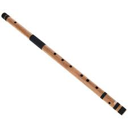

In [ ]:
img = Image.open(f'{img_path}/bansuri.jfif')
img.thumbnail((128,128))
img

In [ ]:
model.predict(f'{img_path}/sarengi.jfif')

('Sarangi',
 tensor(4),
 tensor([3.4984e-08, 1.2509e-06, 5.1791e-06, 2.8752e-06, 9.9984e-01, 3.1652e-05, 1.7369e-06, 5.5002e-05, 2.6087e-06, 6.4064e-05]))

###Test 2

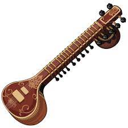

In [ ]:
img = Image.open(f'{img_path}/sitar.jfif')
img.thumbnail((128,128))
img

In [ ]:
model.predict(f'{img_path}/sitar.jfif')

('Sitar',
 tensor(7),
 tensor([3.8327e-07, 9.4791e-07, 5.3947e-07, 1.2201e-06, 2.3373e-05, 7.2441e-05, 4.6385e-06, 9.9718e-01, 7.1662e-05, 2.6481e-03]))

###Test 3

In [ ]:
model.predict(f'{img_path}/santoor.jfif')

('Santoor',
 tensor(3),
 tensor([1.6161e-06, 1.6291e-02, 8.2349e-05, 9.8307e-01, 1.6376e-05, 2.2420e-07, 1.0955e-07, 9.6945e-07, 5.3181e-04, 4.0044e-06]))

In [ ]:
model.predict(f'{img_path}/sarengi.jfif')

('Sarangi',
 tensor(4),
 tensor([3.4984e-08, 1.2509e-06, 5.1791e-06, 2.8752e-06, 9.9984e-01, 3.1652e-05, 1.7369e-06, 5.5002e-05, 2.6087e-06, 6.4064e-05]))